# Acoustic signals detection and clustering from a scattering network

In [ ]:
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from scipy.signal import savgol_filter
from umap.umap_ import UMAP
import xarray as xr
from tqdm import tqdm

from scripts_py import loader

from cmcrameri import cm

Loading model and data
Done !


### Load parametric data and scatterings

In [2]:
# Load parametric data
filepath_parametric = loader.param_path
data_parametric = pickle.load(open(filepath_parametric, "rb"))

# Display
display(data_parametric.head())

filepath_scatterings = loader.scattering_coef_path + "Scat_coef_" + loader.pooling + "_" + loader.data_file

# Load scatterings
data_scatterings, _ = pickle.load(open(filepath_scatterings, "rb"))

# Get sampling rate
sampling_rate = loader.stream[0].stats.sampling_rate
print(f"Sampling rate: {sampling_rate / 1e6} MHz")

,time,norm_cy,PARA1,PARA2,CH,RMS,ABS-ENERGY
timestamp,,,,,,,
2024-12-02 17:01:01+00:00,1499.099923,0.625,1199.3408,-77.5146,1,0.0006,287.877
2024-12-02 17:01:01.050000+00:00,1499.149924,0.650,1006.7749,-78.7354,1,0.0006,268.964
2024-12-02 17:01:01.100000+00:00,1499.199924,0.675,751.9531,-80.8716,1,0.0006,275.290
2024-12-02 17:01:01.150000+00:00,1499.249924,0.700,590.8203,-82.0923,1,0.0006,327.154
2024-12-02 17:01:01.200000+00:00,1499.299923,0.725,406.1890,-84.2285,1,0.0006,275.920


Sampling rate: 2.0 MHz


### Normalize and reshape scatterings

In [3]:
def reshape_scatterings(x):
    """Get the scattering coefficients into an xarray dataset.

    Parameters
    ----------
    x : list
        The scattering coefficients.

    Returns
    -------
    xarray.Dataset
        The scattering database in the xarray.Dataset format.
    """
    # Get metadata
    channels = ["XX"]
    n_channels = len(channels)

    # Xarray attributes
    attributes = {"n_samples": model.bins}

    # Xarray dimensions
    dimensions = (
        "time",
        "channel",
        *[f"f{i + 1}" for i in range(model.depth)],
    )

    # Xarray coordinates
    coordinates = {
        f"f{i + 1}": (dimensions[2 + i], f)
        for i, f in enumerate([bank.centers for bank in model.banks])
    }
    coordinates.update(
        {
            "index": ("time", np.arange(len(segments))),
            "time": ("time", [t * 24 * 3600 for t in times]),
            "channel": ("channel", channels),
        }
    )

    # Xarray data variables
    frequencies = [bank.centers for bank in model.banks]
    n_filters = [len(centers) for centers in frequencies]
    variables = dict()
    for order in range(model.depth):

        # Initialize scattering matrix
        shape = (len(segments), n_channels, *n_filters[: order + 1])
        variable = np.zeros(shape)

        # Variable dimensions
        dimension = (
            "time",
            "channel",
            *[f"f{j + 1}" for j in range(order + 1)],
        )

        # Fill scattering matrix
        for index in range(shape[0]):
            if x[index] is not None:
                for channel in range(n_channels):
                    variable[index, channel] = x[index][order]

        # Assign scattering matrix to data variable
        variables[f"order_{order + 1}"] = (dimension, variable)

    # Assign attributes and data variables to dataset
    ds = xr.Dataset(coords=coordinates, data_vars=variables, attrs=attributes)

    return ds

In [4]:
# Load scatterings
data_scatterings, _ = pickle.load(open(filepath_scatterings, "rb"))

# Extract scattering coefficients
scattering_coefficients = loader.reshape_scatterings(data_scatterings)

# Work on a copy
scatterings_normalized = scattering_coefficients.copy()

# Get the scattering coefficients (log)
scatterings_normalized = np.log(scatterings_normalized + 1e-100)

# Normalize
scatterings_normalized.order_2.data -= scatterings_normalized.order_1.data[:, :, :, None]
scatterings_normalized.order_1.data /= scatterings_normalized.order_1.data.std()
scatterings_normalized.order_1.data -= scatterings_normalized.order_1.data.min()
scatterings_normalized.order_2.data /= scatterings_normalized.order_2.data.std() 
scatterings_normalized.order_2.data -= scatterings_normalized.order_2.data.min()

# Mask Nyquist frequencies
scatterings_normalized = scatterings_normalized.where(scatterings_normalized.f2 < scatterings_normalized.f1, 0)
scatterings_normalized["order_1"] = scatterings_normalized.order_1.mean(dim="f2") # Reduce order 1 which is duplicated

# Keep non na
print(f"Time samples before NaN droppping: {len(scatterings_normalized.time)}")
scatterings_normalized = scatterings_normalized.dropna(dim="time", how="any")
print(f"Time samples after NaN droppping: {len(scatterings_normalized.time)}")

def design_matrix(ds, standardize=True):
    """Design matrix of scattering coefficients."""
    n = ds.time.shape[0]
    x1 = ds.order_1.data.reshape(n, -1)
    x2 = ds.order_2.data.reshape(n, -1)
    x = np.hstack((x1, x2))
    if standardize is True:
        x -= x.mean(axis=0)
        x /= x.std(axis=0)
    return x

# Design matrix
t = scatterings_normalized.time - scatterings_normalized.time[0]
x = design_matrix(scatterings_normalized, standardize=False)
print(f"Extracted design matrix of shape: {x.shape}")

Time samples before NaN droppping: 3000
Time samples after NaN droppping: 3000
Extracted design matrix of shape: (3000, 620)


# AE signals detection

### UMAP on dataset

In [5]:
umap_model = UMAP(n_components=2, random_state=42, n_neighbors=5, min_dist=0, n_jobs=-1)
atlas = umap_model.fit_transform(x)

/home/delaselt/miniconda3/envs/scatnet_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/delaselt/miniconda3/envs/scatnet_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Two-classes DBSCAN on UMAP atlas

Found 2064 items in class 0
Found 936 items in class 1


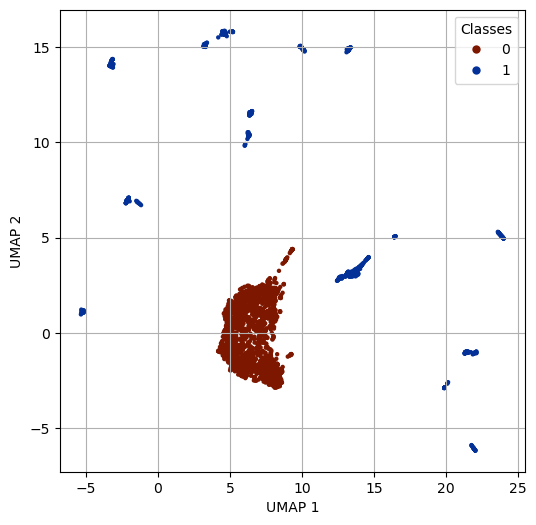

In [6]:
minpts = 300
eps = 2.15

# Instance
outlier_model = DBSCAN(eps=eps, min_samples=minpts, n_jobs=-1)

# Apply model
outliers = outlier_model.fit_predict(atlas)

# Renumbering: largest class is 0, others are 1, 2, ...
outliers[outliers == -1] = 1

n_clusters = len(np.unique(outliers))

# Class counts
classes, counts = np.unique(outliers, return_counts=True)
for category, count in zip(classes, counts):
    print(f"Found {count} items in class {category}")

# Outlier class detection
outlier_class = np.argmin(counts)

if outlier_class == 0:
    outlier_detections = np.array(outliers != outlier_class).astype(float)
else:
    outlier_detections = np.array(outliers == outlier_class).astype(float)

# Outlier detection rate per time units
outlier_rate = savgol_filter(outlier_detections, 15, 1)
outlier_rate /= (t[1] - t[0]).values

# Show on top of UMAP
fig, ax = plt.subplots(figsize=(6, 6))
scatter_labels = ax.scatter(*atlas.T, s=10, linewidths=0, c=outliers, cmap=cm.roma, alpha=1)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.grid()
ax.legend(*scatter_labels.legend_elements(), title="Classes")

In [7]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"BIDBSCAN-"+str(minpts)+"-"+str(eps)+"_umap-"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig.savefig(save_path,bbox_inches='tight')

### AE signals / acoustic background graphics

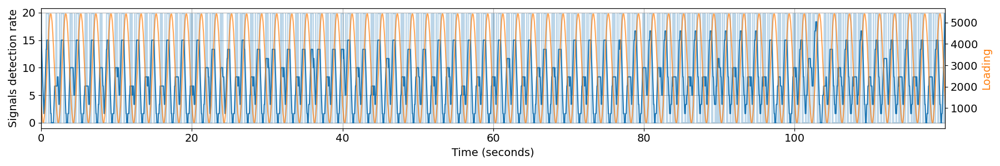

In [8]:
# Plot
%matplotlib widget
figOUTLIERS, ax = plt.subplots(nrows=1, figsize=(18, 3))
ax.plot(t, outlier_detections * outlier_rate.max(), alpha=0.3)
ax.plot(t, outlier_rate, c="C0")
ax.set_xlabel("Time (seconds)", fontsize=14)
ax.set_ylabel("Signals detection rate", fontsize=14)
ax.grid()
plt.setp(ax.get_xticklabels(), fontsize=14)
plt.setp(ax.get_yticklabels(), fontsize=14)
ax_2 = ax.twinx()
ax_2.plot(data_parametric.time - data_parametric.time.iloc[0], data_parametric.PARA1,alpha=0.7, c="C1")
plt.setp(ax_2.get_yticklabels(), fontsize=14)
ax_2.set_ylabel("Loading", color="C1", fontsize=14)
figOUTLIERS.tight_layout()
plt.xlim(t.min(), t.max())

plt.show()

# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"Binary-clustering_detection-rates_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
figOUTLIERS.savefig(save_path,bbox_inches='tight')

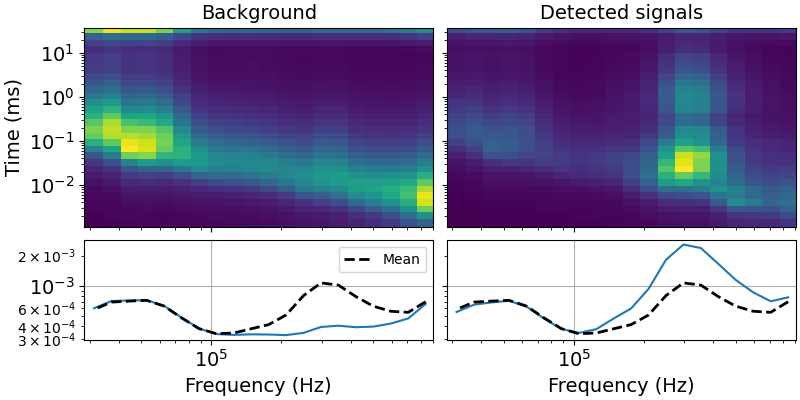

In [9]:
# Extract matrix
n = scattering_coefficients.time.shape[0]
x1 = scattering_coefficients.order_1.data.reshape(n, -1)
x2 = scattering_coefficients.order_2.data.reshape(n, -1)
vmin, vmax = x2.min(), x2.max()

x2_mean = x2.mean(axis=0)
x1_mean = x1.mean(axis=0)

# Plot
fig, ax = plt.subplots(nrows=2, ncols=n_clusters, figsize=(8, 4), sharex="col", sharey="row", gridspec_kw={"height_ratios": [2, 1]}, constrained_layout=True)
for category in range(2):
    select_cluster = outliers == category
    order_2 = x2[select_cluster].mean(axis=0) 
    # order_2 -= x2_mean
    order_2 = order_2.reshape(*scatterings_normalized.order_2.shape[2:])
    img = ax[0, category].pcolormesh(scatterings_normalized.f1, 1/scatterings_normalized.f2*1000, order_2.T, shading="auto", rasterized=True,vmin=vmin)
    ax[0, category].set_xscale("log")
    ax[0, category].set_yscale("log")
    # plt.colorbar(img, ax=ax[0, category])
    plt.setp(ax[0,category].get_xticklabels(), fontsize=14)
    plt.setp(ax[0,category].get_yticklabels(), fontsize=14)
    ax[1, category].set_yscale("log")
    order_1 = x1[select_cluster].mean(axis=0)
    ax[1, category].plot(scatterings_normalized.f1, order_1)
    ax[1, category].plot(scatterings_normalized.f1, x1_mean, c="k", lw=2, linestyle="--", label="Mean")
    plt.setp(ax[1,category].get_xticklabels(), fontsize=14)
    plt.setp(ax[1,category].get_yticklabels(), fontsize=14)
    ax[1, category].grid()
ax[1, 0].set_xlabel("Frequency (Hz)", fontsize=14)
ax[1, 1].set_xlabel("Frequency (Hz)", fontsize=14)
ax[0, 0].set_ylabel("Time (ms)", fontsize=14)
ax[1, 0].legend( fontsize=10)
ax[0, 0].set_title("Background", fontsize=14)
ax[0, 1].set_title("Detected signals", fontsize=14)

plt.show()

# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"Binary-clustering_scat-coeff_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig.savefig(save_path,bbox_inches='tight')

# AE signals clustering

## UMAP on signals

In [10]:
umap_model_outlier = UMAP(n_components=2, random_state=42, n_neighbors=5, min_dist=0, n_jobs=-1)
atlas_outliers = umap_model_outlier.fit_transform(x[outlier_detections == 1])

/home/delaselt/miniconda3/envs/scatnet_env/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/delaselt/miniconda3/envs/scatnet_env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## DBSCAN on atlas

Number of clusters: 14


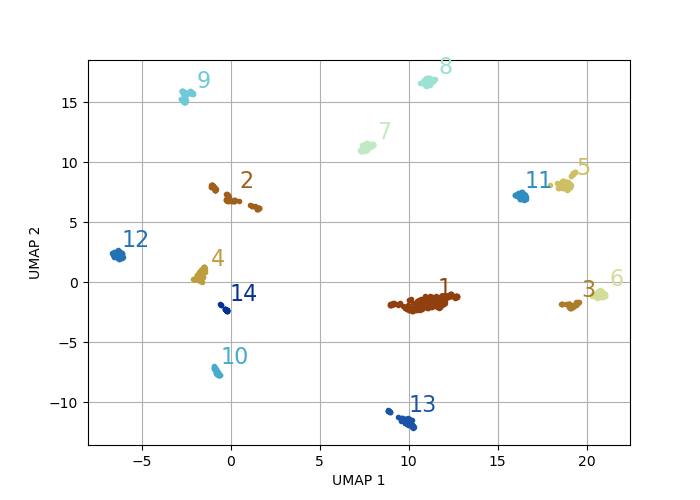

In [12]:
minpts = 5
# eps = 1.3 # Default value
eps = 0.8 # Value for the example dataset

clusterer = DBSCAN(min_samples=minpts, eps=eps, n_jobs=-1)
predictions = clusterer.fit_predict(atlas_outliers)

predictions += 1
predictions[predictions == 0] = -1
classes = np.unique(predictions)

# Show
fig, ax = plt.subplots(figsize=(7, 5))
for category in np.unique(predictions):
    color_style = cm.roma(category / len(np.unique(predictions))) if category != -1 else "0.8"
    ax.plot(*atlas_outliers[predictions == category].T, ".", label=category,color=color_style)
    ax.text(atlas_outliers[predictions == category][:, 0].mean()+1,
            atlas_outliers[predictions == category][:, 1].mean()+1.2,
            f"{category}",
            fontsize=16, color=color_style, ha='center', va='center')
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.grid()
# set legend outside the plot
# ax.legend(title="Class", loc="upper left", bbox_to_anchor=(1, 1))

# print number of clusters
n_clusters = len(classes[classes != -1])
print(f"Number of clusters: {n_clusters}")

# Extract outliers waveforms from loader
outlier_indices = np.argwhere(outlier_detections).squeeze()
outlier_segments = [loader.segments[o] for o in outlier_indices]

In [13]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"OUTLIERS_DBSCAN"+str(minpts)+"-"+str(eps)+"_umap-"+str(umap_model_outlier.n_neighbors)+"-"+str(umap_model_outlier.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig.savefig(save_path,bbox_inches='tight')

# Clusters general graphics

### Overall view of clusters information

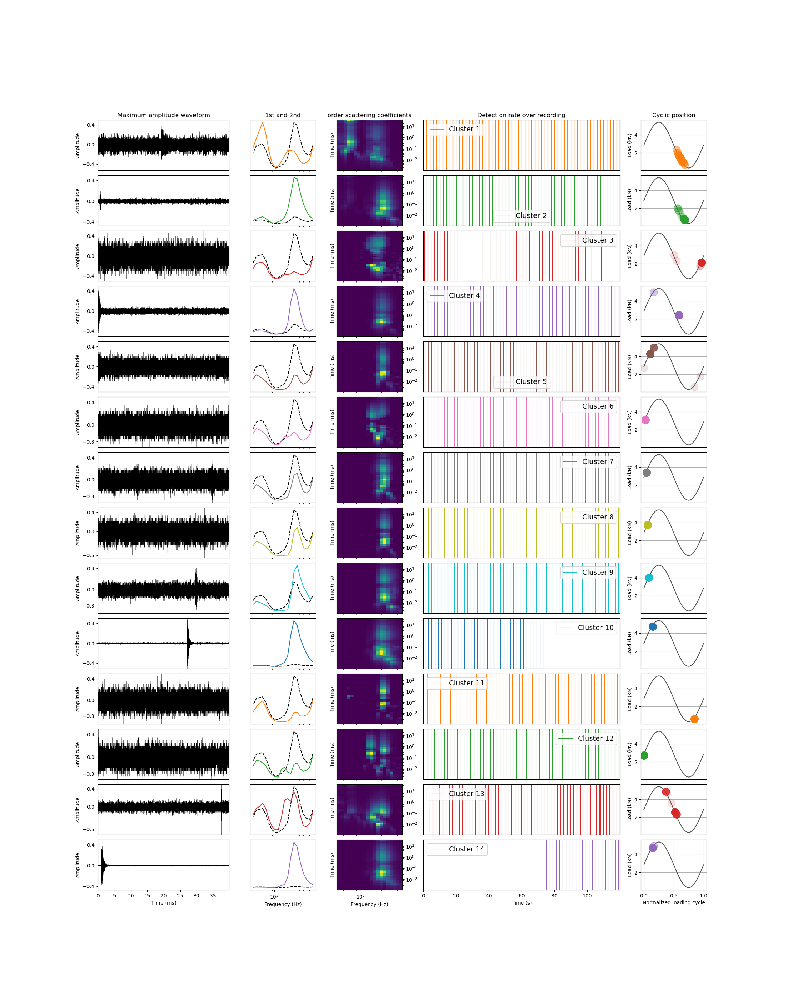

In [14]:
from scipy.interpolate import interp1d
from scipy.signal import hilbert

# Interpolate parametric data on input signal
t_i = t.copy()
cycles_n = data_parametric[:].norm_cy.values
t_p = (data_parametric[:].time - data_parametric.time.iloc[0]).values
isna = np.isnan(cycles_n)
cycles_n = cycles_n[~isna]
t_p = t_p[~isna]
interpolator = interp1d(t_p, cycles_n, bounds_error=False, fill_value=0)
cycles_ni = interpolator(t_i)

load = data_parametric[:].PARA1.values
isna = np.isnan(load)
load = load[~isna]
interpolator = interp1d(t_p, load, bounds_error=False, fill_value=0)
load_i = interpolator(t_i)

# Correction of the cyclic position
indexes = np.where((cycles_ni >= 0.780) & (cycles_ni <= 0.785))[0]
cycles_ni[indexes] = cycles_ni[indexes]*0.01

# Turn to one-hot
one_hot = pd.get_dummies(predictions)
cluster_indexes = np.arange(n_clusters)
one_hot = xr.DataArray(one_hot, dims=["time", "cluster"], coords={"time": t[outliers==1], "cluster": cluster_indexes})

# Extract matrix
n = scattering_coefficients.time.shape[0]
x1 = scattering_coefficients.order_1.data.reshape(n, -1)
x2 = scattering_coefficients.order_2.data.reshape(n, -1)
vmin, vmax = x2.min(), x2.max()
acoustic_background_order_2_mean = x2[outlier_detections==0].mean(axis=0)
acoustic_background_order_1_mean = x1[outlier_detections==0].mean(axis=0)

fig_full, ax = plt.subplots(n_clusters, 5, figsize=(22, n_clusters*2), 
                      gridspec_kw={'width_ratios': [2, 1, 1, 3, 1],
                                   'wspace': 0.2,  # Width spacing between columns
                                   'hspace': 0.1}) # Height spacing between rows

# delete element -1 from the classes list
# classes = classes[classes != -1]

for i, category in enumerate(classes):

    # if category == -1:
    #     continue
    # else:
    #     i -= 1  # Adjust index for -1 class

    cluster_i = predictions == category

    # Plot a waveform per classe on first column
    indexes = np.where(one_hot.isel(cluster=i) == 1)[0]

    # find the index of the highest amplitude waveform in the cluster
    index = np.argmax([np.max(outlier_segments[o]) for o in indexes])
    data = outlier_segments[indexes[index]]
    data = data / np.max(data) / 2
    time = np.arange(len(data)) / sampling_rate*1000
    ax[i, 0].plot(time, data, lw=0.2, c="k")
    ax[i, 0].set_ylabel("Amplitude")
    ax[i, 0].set_ylim(data.min(), data.max())
    ax[i, 0].set_xlim(0, time.max())

    # set only 3 ticks on y-axis
    ax[i, 0].set_yticks([round(data.min()+0.1, 1), 0, round(data.max()-0.1, 1)])

    # Plot the mean 1st order scattering coefficients for this cluster
    order_1 = x1[outlier_detections == 1][predictions == category].mean(axis=0) 
    order_1 = order_1.reshape(*scattering_coefficients.order_1.shape[2:])
    ax[i, 1].plot(scatterings_normalized.f1, x1.mean(axis=0),c="k",linestyle="--")   
    ax[i, 1].plot(scattering_coefficients.f1, order_1, c=f"C{category}")
    # ax[i, 1].plot(scatterings_normalized.f1, x1[outlier_detections == 1].mean(axis=0))
    ax[i, 1].set_yticks([])
    ax[i, 1].set_xscale("log")
    # ax[1, category].set_yscale("log")

    # Plot the mean 2nd order scattering coefficients for this cluster
    order_2 = x2[outlier_detections == 1][predictions == category].mean(axis=0) 
    order_2 -= acoustic_background_order_2_mean
    order_2 = order_2.reshape(*scattering_coefficients.order_2.shape[2:])
    img = ax[i, 2].pcolormesh(scattering_coefficients.f1, 1/scattering_coefficients.f2*1000, order_2.T, shading="auto", rasterized=True,vmin=vmin) # add vmin=vmin, vmax=vmax for real contrast
    ax[i, 2].set_xscale("log")
    ax[i, 2].set_yscale("log")
    ax[i, 2].set_ylabel("Time (ms)")
    ax[i, 2].yaxis.tick_right()
    # ax[i, 2].yaxis.set_label_position("right")

    # Plot the detection rate for this cluster
    cluster_detection = one_hot.isel(cluster=i).values
    # cluster_rate = savgol_filter(cluster_detection, 2, 1)
    # cluster_rate /= (t[1] - t[0]).values
    # ax[i, 3].plot(t[outlier_detections == 1], cluster_rate)
    for detection in np.argwhere(cluster_detection):
        ax[i, 3].axvline(t[outlier_detections == 1][detection[0]], color=f"C{category}", alpha=1, lw=0.8)
    # for k in range(5):
    #     ax[i, 3].axvline(t[outlier_detections == 1].max()*(k+1)/6, color="k", alpha=1, lw=1,linestyle="--")
    ax[i, 3].set_xlim(0, t[outlier_detections == 1].max())
    ax[i, 3].set_yticks([])
    ax[i, 3].legend({f"Cluster {category}"},fontsize=14)
    
    # Plot a sinus wave and the cyclic positions
    f_sollicitation = 1  # Hz
    timesteps = np.linspace(0, 1/f_sollicitation, 100)
    max_load = load_i.max()*1e-3
    mean_load = load_i.mean()*1e-3
    sinus = (max_load-mean_load)*np.sin(2 * np.pi * f_sollicitation * timesteps)+ mean_load
    ax[i, 4].plot(timesteps, sinus, color="k",alpha=0.7,lw=1.5)
    ax[i, 4].set_ylabel("Load (kN)")
    ax[i, 4].grid()
    cyclic_position = cycles_ni[outlier_detections == 1][cluster_i]
    cyclic_position[cyclic_position > 1] = cyclic_position[cyclic_position > 1]-1
    loads = load_i[outlier_detections == 1][cluster_i]*1e-3 # -0.1
    ax[i, 4].plot(cyclic_position, loads, color=f"C{category}", lw=0, marker='.', markersize=30, alpha=0.15)
    ax[i, 4].set_xlim(-0.05, timesteps.max()+0.05)


    if i == n_clusters - 1:
        ax[i, 0].set_xlabel("Time (ms)")
        ax[i, 1].set_xlabel("Frequency (Hz)")
        ax[i, 2].set_xlabel("Frequency (Hz)")
        ax[i, 3].set_xlabel("Time (s)")
        ax[i, 4].set_xlabel("Normalized loading cycle")
    else:
        ax[i, 0].set_xticks([])
        ax[i, 1].set_xticks([])
        ax[i, 2].set_xticks([])
        ax[i, 3].set_xticks([])
        ax[i, 4].set_xticks([])

ax[0, 0].set_title("Maximum amplitude waveform")
ax[0, 1].set_title("1st and 2nd")
ax[0, 2].set_title("order scattering coefficients")
ax[0, 3].set_title("Detection rate over recording")
ax[0, 4].set_title("Cyclic position")

# Change fontsize of all texts in the figure
for obj in fig.findobj():
    if hasattr(obj, "set_fontsize"):
        obj.set_fontsize(14)


In [15]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"CLUSTERS_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig_full.savefig(save_path,bbox_inches='tight')

## Detection rate and waveforms for 2 clusters


/tmp/ipykernel_15538/2619897158.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


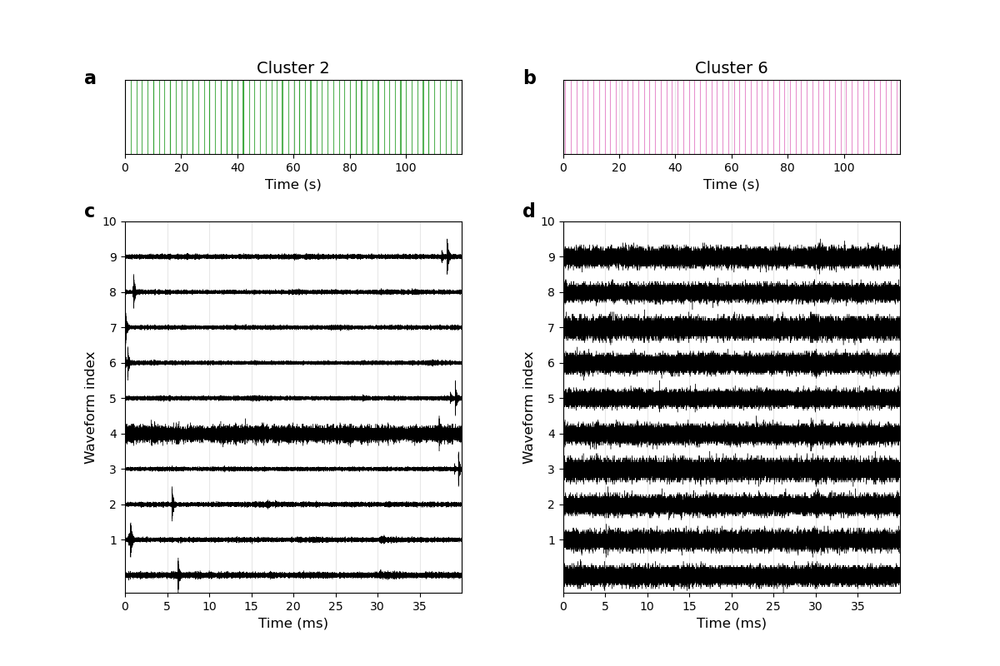

Figure saved to: DR_WFs_7075_APT_0.1_1_2_ch1_0-250_max.pdf


In [16]:
# Two-column figure: Detection rate and waveforms for 2 clusters
import numpy as np
import matplotlib.pyplot as plt

# Select 2 clusters to display (first two non-noise clusters)
# selected_clusters = [c for c in classes if c != -1][:2]
selected_clusters = [2,6]

fig_2col, axes = plt.subplots(2, 2, figsize=(12, 8), 
                               gridspec_kw={'height_ratios': [1, 5], 'hspace': 0.3, 'wspace': 0.3})

n_waveforms_display = 10

for col, category in enumerate(selected_clusters):
    
    cluster_i = predictions == category
    cluster_detection = one_hot.isel(cluster=np.where(classes == category)[0][0]).values
    
    # Top row: Detection rate
    ax_rate = axes[0, col]
    for detection in np.argwhere(cluster_detection):
        ax_rate.axvline(t[outlier_detections == 1][detection[0]], color=f"C{category}", alpha=0.8, lw=0.8)
    ax_rate.set_xlim(0, t[outlier_detections == 1].max())
    ax_rate.set_yticks([])
    ax_rate.set_xlabel("Time (s)", fontsize=12)
    ax_rate.set_title(f"Cluster {category}", fontsize=14)
    ax_rate.grid(alpha=0.3)
    
    # Bottom row: 10 random waveforms
    ax_wf = axes[1, col]
    indexes = np.where(one_hot.isel(cluster=np.where(classes == category)[0][0]) == 1)[0]
    
    # Select random waveforms
    np.random.seed(7)  # For reproducibility
    random_indices = np.random.choice(indexes, size=min(n_waveforms_display, len(indexes)), replace=False)
    
    for j, index in enumerate(random_indices):
        data = outlier_segments[index]
        data = data / np.max(np.abs(data)) / 2  # Normalize
        time_wf = np.arange(len(data)) / sampling_rate * 1000  # Convert to ms
        ax_wf.plot(time_wf, data + j, lw=0.3, c="k")
    
    ax_wf.set_xlabel("Time (ms)", fontsize=12)
    ax_wf.set_ylabel("Waveform index", fontsize=12)
    ax_wf.set_xlim(0, time_wf.max())
    ax_wf.set_ylim(-0.5, n_waveforms_display - 0.5)
    ax_wf.set_yticks(range(1, n_waveforms_display+1))
    ax_wf.grid(alpha=0.3)

# Add subfigure labels
axes[0, 0].text(-0.12, 1.15, "a", transform=axes[0, 0].transAxes, fontsize=16, fontweight='bold', va='top')
axes[0, 1].text(-0.12, 1.15, "b", transform=axes[0, 1].transAxes, fontsize=16, fontweight='bold', va='top')
axes[1, 0].text(-0.12, 1.05, "c", transform=axes[1, 0].transAxes, fontsize=16, fontweight='bold', va='top')
axes[1, 1].text(-0.12, 1.05, "d", transform=axes[1, 1].transAxes, fontsize=16, fontweight='bold', va='top')

fig_2col.suptitle("Detection rates and waveforms for two clusters", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# Save the figure
save_path_2col = loader.fig_path + "DR_WFs_" + loader.data_file[7:-4] + "_" + loader.pooling + ".pdf"
fig_2col.savefig(save_path_2col, bbox_inches='tight')
print(f"Figure saved to: {save_path_2col}")

### Waveforms cross-correlation intra cluster

Cluster 1: Stacked waveform STR: 0.1809110612467712, Number of waveforms: 188, Amplitude (dB): 21.15, SNRE: 0.34
Cluster 2: Stacked waveform STR: 1.7110870780585612, Number of waveforms: 79, Amplitude (dB): 40.67, SNRE: 0.81
Cluster 3: Stacked waveform STR: 0.06884634660168704, Number of waveforms: 41, Amplitude (dB): 12.76, SNRE: 0.24
Cluster 4: Stacked waveform STR: 1.1851218739615323, Number of waveforms: 63, Amplitude (dB): 37.48, SNRE: 0.56
Cluster 5: Stacked waveform STR: 0.061135993487127054, Number of waveforms: 76, Amplitude (dB): 11.73, SNRE: 0.14
Cluster 6: Stacked waveform STR: 0.1328635354061666, Number of waveforms: 60, Amplitude (dB): 18.47, SNRE: 0.16
Cluster 7: Stacked waveform STR: 0.13614463360656165, Number of waveforms: 60, Amplitude (dB): 18.68, SNRE: 0.17
Cluster 8: Stacked waveform STR: 0.22750885295669607, Number of waveforms: 60, Amplitude (dB): 23.14, SNRE: 0.17
Cluster 9: Stacked waveform STR: 0.4153222089757043, Number of waveforms: 60, Amplitude (dB): 28.3

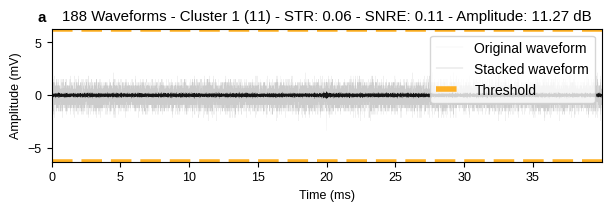

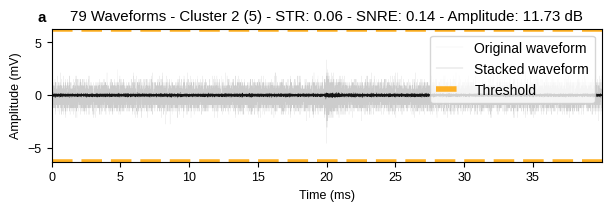

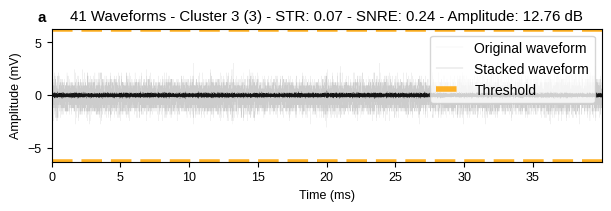

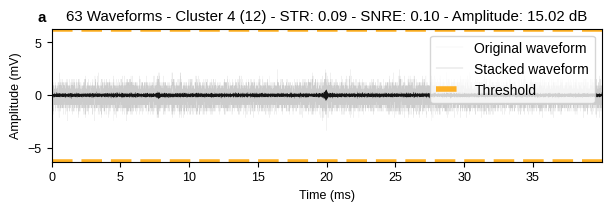

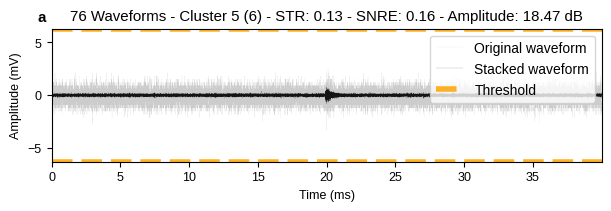

...

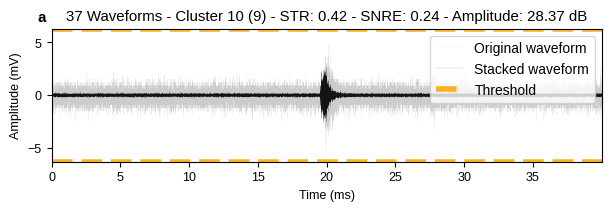

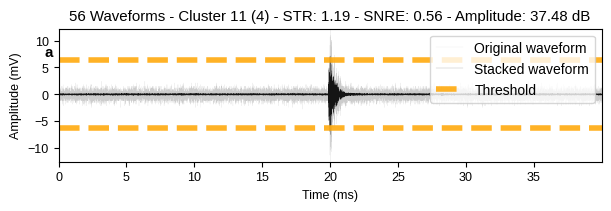

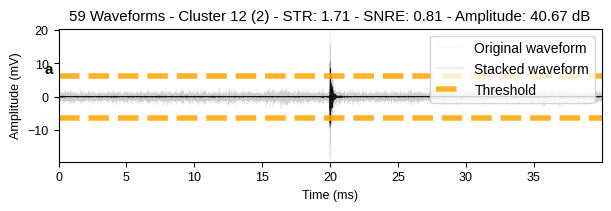

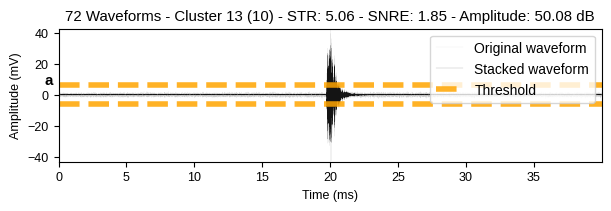

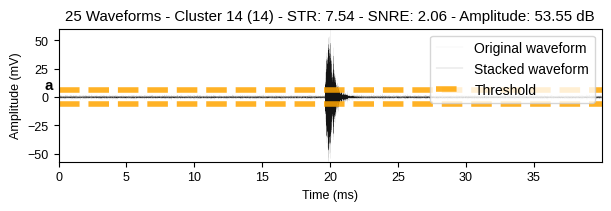

In [22]:
AE_thr = 10**((36+40)/20)*1e-6
RMS_window_size = 0.002

from scipy.signal import correlate
from scipy import signal

stacked_waveforms = np.zeros((n_clusters, len(outlier_segments[0])))
stacked_waveforms_cut = np.zeros((n_clusters, int(RMS_window_size * sampling_rate)))
ref_waveform = np.zeros((n_clusters, len(outlier_segments[0])))
STR = np.zeros(n_clusters)
amplitude_dB = np.zeros(n_clusters)
SNRE = np.zeros(n_clusters)
signal_RMS = np.zeros(n_clusters)
noise_level = np.zeros(n_clusters)
n_waveforms = np.zeros(n_clusters, dtype=int)

for c, cl in enumerate(classes):
        
        # Initialize
        indexes = np.where(one_hot.isel(cluster=c) == 1)[0]
        n_waveforms[c] = len(indexes)
        waveforms = [outlier_segments[indexes[i]] for i in range(n_waveforms[c])]
        
        # set reference as the maximum amplitude signal
        reference = np.argmax(np.max(np.abs(waveforms), axis=1))
            
        # roll the reference waveform to center its maximum value
        ref_waveform[c] = np.roll(waveforms[reference], len(waveforms[0])//2 - np.argmax(np.abs(waveforms[reference])))

        # cut the windows around the maximum amplitude
        max_index = np.argmax(np.abs(ref_waveform))
        window_size = int(RMS_window_size * sampling_rate)
        start_index = max(0, max_index - window_size // 2)
        end_index = min(len(ref_waveform[c]), max_index + window_size // 2)
        waveforms_cut = ref_waveform[c][start_index:end_index]
        noise = ref_waveform[c][end_index-int(RMS_window_size * 2 * sampling_rate) :end_index-int(RMS_window_size * sampling_rate)]

        # compute the noise level on the cut waveform
        noise_level[c] = np.sqrt(np.mean(ref_waveform**2))

        # Filter waveforms
        waveforms_filtered = []
        for index, waveform in enumerate(waveforms):
            b, a = signal.butter(2, [2/10, 4/10], btype='band')  # Bandpass filter between 3 and 4 kHz - could be adjusted based on the frequency content of the signals
            waveforms_filtered.append(signal.lfilter(b, a, waveform))
            
        # Cross-correlation
        aligned_waveforms = []
        aligned_waveforms_filtered = []

        for index in range(1, len(waveforms_filtered)):
            corr = signal.correlate(waveforms_filtered[reference], waveforms_filtered[index], mode='full')
            lag = signal.correlation_lags(len(waveforms_filtered[reference]), len(waveforms_filtered[index]), mode='full')

            # Aligned based on max lag
            max_lag = lag[np.argmax(corr)]
            aligned_waveforms_filtered.append(np.roll(waveforms_filtered[index], max_lag))
            aligned_waveforms.append(np.roll(waveforms[index], max_lag))

        # Calculate stack and roll it to center its maximum value
        stacked_waveforms[c] = np.sum(aligned_waveforms, axis=0)/n_waveforms[c]
        stacked_waveforms[c] -= np.mean(stacked_waveforms[c])
        stacked_waveforms[c] = np.roll(stacked_waveforms[c], len(stacked_waveforms[0])//2 - np.argmax(stacked_waveforms[c]))

        # cut the windows around the maximum amplitude
        max_index = np.argmax(np.abs(stacked_waveforms[c]))
        window_size = int(RMS_window_size * sampling_rate)
        start_index = max(0, max_index - window_size // 4)
        end_index = min(len(stacked_waveforms[c]), max_index + 3*window_size // 4)
        stacked_waveforms_cut[c] = stacked_waveforms[c][start_index:end_index]

        # compute the noise level on the cut waveform
        signal_RMS[c] = np.sqrt(np.mean(stacked_waveforms[c]**2))

        # compute the Signal to Threshold Ratio (STR), amplitude in dB and Signal to Noise Ratio Equivalent (SNRE)
        amplitude = np.max(np.abs(stacked_waveforms[c]))
        STR[c] = amplitude / AE_thr 
        amplitude_dB[c] = 20 * np.log10(amplitude / 1e-6)-40
        SNRE[c] = signal_RMS[c] / noise_level[c]
        print(f"Cluster {cl}: Stacked waveform STR: {STR[c]}, Number of waveforms: {n_waveforms[c]}, Amplitude (dB): {amplitude_dB[c]:.2f}, SNRE: {SNRE[c]:.2f}")

# sort stacked_waveforms, STR, amplitude_dB, SNRE by STR
sorted_indices = np.argsort(STR)[::1]
stacked_waveforms = stacked_waveforms[sorted_indices]
STR = STR[sorted_indices]
amplitude_dB = amplitude_dB[sorted_indices]
SNRE = SNRE[sorted_indices]
clusters = classes[sorted_indices]
ref_waveform = ref_waveform[sorted_indices]

for c, cl in enumerate(clusters):

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 2), constrained_layout=True)

        t_stacked = (np.arange(len(stacked_waveforms[c])) / sampling_rate) * 1000  # Time vector in milliseconds
        ax.plot(t_stacked, ref_waveform[c]*1000, color='grey', lw=0.1,rasterized=True, alpha=0.4,label='Original waveform')
        ax.plot(t_stacked, stacked_waveforms[c]*1000, color='k', lw=0.1,rasterized=True, alpha=0.9, label='Stacked waveform')
        # ax.axvline(x=t_stacked[start_index], color='b', linestyle='--', lw=1, label='cutting window',alpha=0.85)
        # ax.axvline(x=t_stacked[end_index], color='b', linestyle='--', lw=1,alpha=0.85)
        # ax.axhline(y=noise_level[c], color='r', linestyle='--', lw=1, label='original noise RMS',alpha=0.85)
        # ax.axhline(y=-noise_level[c], color='r', linestyle='--', lw=1,alpha=0.85)
        # ax.axhline(y=signal_RMS[c], color='orange', linestyle='--', lw=2, label='Stacked signal RMS',alpha=0.85)
        ax.axhline(y=AE_thr*1000, color='orange', linestyle='--', lw=4,alpha=0.85)
        ax.axhline(y=-AE_thr*1000, color='orange', linestyle='--', lw=4, label='Threshold',alpha=0.85)
        # ax.axhline(y=-signal_RMS[c], color='orange', linestyle='--', lw=2,alpha=0.85)
        ax.legend(fontsize=10, loc='upper right')
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('Amplitude (mV)')
        ax.set_title(f'{n_waveforms[c]} Waveforms - Cluster {c+1} ({cl}) - STR: {STR[c]:.2f} - SNRE: {SNRE[c]:.2f} - Amplitude: {amplitude_dB[c]:.2f} dB')
        ax.set_xlim([0, t_stacked.max()])
        # ax.set_xlim([18, 22.5])
        # ax.set_ylim([-2, 2])
        
        ax.set_ylim([min(-AE_thr*1000,np.min(ref_waveform[c]*1000)), max(AE_thr*1000,np.max(ref_waveform[c]*1000))])
        # ax.set_ylim([np.min(stacked_waveforms[c]*1000), np.max(stacked_waveforms[c]*1000)])
        # ax.set_ylim([min(-noise_level[c]*3,np.min(stacked_waveforms[c]*1000)), max(noise_level[c]*3,np.max(stacked_waveforms[c]*1000))])
        ax.text(-1, 7, "a", fontsize="large", fontweight="bold")

        # ax.set_ylim([np.min(ref_waveform[c]*1000), np.max(ref_waveform[c]*1000)])
        
        plt.savefig(loader.fig_path+f"STACK_WF_cl{c+1}.pdf", dpi=300, bbox_inches='tight')

# compute the mapping from old class index to new class index
class_mapping = {clusters[new_idx]: new_idx+1 for new_idx, _ in enumerate(sorted_indices)}

# export results in a dataframe and save it as a csv file
results_df = pd.DataFrame({
    'Cluster': clusters,
    'STR': STR,
    'Amplitude_dB': amplitude_dB,
    'SNRE': SNRE
})
results_df.to_csv(loader.fig_path+"Stacked_waveforms_features_"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".csv", index=False)

# Cyclic position plot

In [23]:
# radar, ax = plt.subplots(subplot_kw={"projection": "polar"}, figsize=(10, 10))
number_of_cycle_bins = 70
stress_cycle_phases = np.linspace(0, 2 * np.pi, number_of_cycle_bins)

cluster_cycle_histograms = np.zeros((n_clusters, number_of_cycle_bins))
cluster_cycle_bins = np.zeros((n_clusters, number_of_cycle_bins+1))

for i, category in enumerate(classes):

    # if category == -1:
    #     continue
    # else:
    #     i -= 1  # Adjust index for -1 class

    cluster_i = predictions == category

    cluster_detection = one_hot.isel(cluster=i).values

    event_times = pd.Series(t[outlier_detections == 1][cluster_detection], index=t[outlier_detections == 1][cluster_detection])

    load = pd.Series((load_i-np.mean(load_i))/np.max((load_i-np.mean(load_i))), index=t_i)

    # Get cycle angle with Hilbert transform
    load_analytic = pd.Series(hilbert(load), index=load.index)
    load_angle = pd.Series(np.angle(load_analytic), index=load.index)
    event_angle = -load_angle[event_times.index]

    # rotate the angle so that 0 is at the top
    event_angle = event_angle - np.pi/2
    event_angle[event_angle < -np.pi] = event_angle[event_angle < -np.pi] + 2*np.pi

    # Histogram
    cluster_cycle_histograms[i], cluster_cycle_bins[i] = np.histogram(event_angle, bins=np.linspace(-np.pi, np.pi, num=number_of_cycle_bins+1))

    # Figure
    # ax.bar(bins[:-1], count, width=np.diff(bins), align="edge",label=f"{category}",alpha=0.5, color=cm.roma(category / len(classes)))
    # ax.plot(bins[:-1], count, label=f"{category}", alpha=1, color=cm.romaO_r(np.mean(event_angle+np.pi)/(2*np.pi)), lw=2)
    # ax.fill_between(bins[:-1], count, alpha=0.3, color=cm.romaO_r(np.mean(event_angle+np.pi)/(2*np.pi))) # colored area under the curve

    # ax.set_yticklabels([])
    # ax.legend(fontsize=14)

# Change fontsize of all texts in the figure
# for obj in fig.findobj():
#     if hasattr(obj, "set_fontsize"):
#         obj.set_fontsize(14)
    
# fig.show()


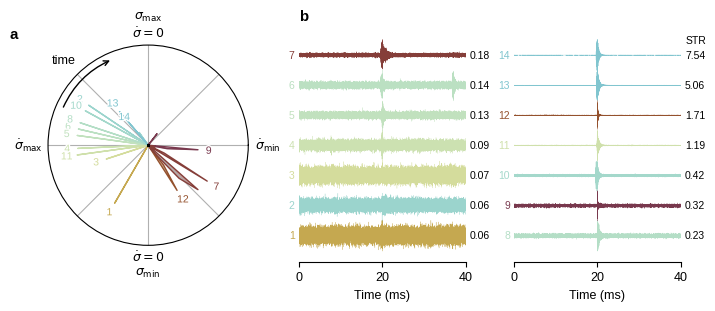

In [24]:
# From L. Seydoux

waveform_duration_seconds = 0.04

import cmocean
from matplotlib import patheffects 
import matplotlib.font_manager as fm

# Check if Arial is available, use alternatives if not
available_fonts = [f.name for f in fm.fontManager.ttflist]
if 'Arial' in available_fonts:
    font_family = "Arial"
elif 'Liberation Sans' in available_fonts:
    font_family = "Liberation Sans"
else:
    font_family = "DejaVu Sans"  # Default fallback

plt.rcParams["font.size"] = 9
plt.rcParams["font.family"] = font_family
plt.rcParams["savefig.dpi"] = 600
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.constrained_layout.use"] = True

%config InlineBackend.figure_format = 'retina' 

COLORMAP = cm.romaO_r

# Normalize cycle histograms to [0,1] range for consistent polar plotting
cluster_cycle_histograms /= cluster_cycle_histograms.max()

# Normalize waveforms: each stack normalized by its maximum absolute amplitude
# This ensures all waveforms are displayed with comparable visual impact
stacked_waveforms /= np.abs(stacked_waveforms).max(axis=1, keepdims=True)


# Create figure
figure, axis_dict = plt.subplot_mosaic(
    [["polar", "waveforms_1", "waveforms_2"]],
    figsize=(7, 3),
    per_subplot_kw={"polar": {"projection": "polar"}},
    width_ratios=[1.2, 1, 1],
    gridspec_kw={"hspace": 0},
)

# Histograms
for cluster_id in range(n_clusters):

    cluster_id_mapped = class_mapping[cluster_id+1]-1

    # Find the cycle phase where this cluster has maximum activity
    peak_phase_index = np.argmax(cluster_cycle_histograms[cluster_id_mapped])
    peak_phase_angle = stress_cycle_phases[peak_phase_index]
    peak_magnitude = cluster_cycle_histograms[cluster_id_mapped][peak_phase_index]

    # Color each cluster by its peak phase using the cyclic colormap
    cluster_color = COLORMAP((peak_phase_index) / (number_of_cycle_bins))

    # Add a dot in the center of tje polar plot
    axis_dict["polar"].plot(0, 0, "o", color="k", markersize=1, zorder=5)

    # Add cluster number label at the peak of each distribution
    axis_dict["polar"].text(
        peak_phase_angle,
        peak_magnitude + 0.15,
        str(class_mapping[cluster_id_mapped+1]),
        ha="center",
        va="center",
        color=cluster_color,
        size="small",
        path_effects=[patheffects.withStroke(linewidth=2, foreground="w")],
    )

    # Plot the distribution curve
    axis_dict["polar"].plot(
        stress_cycle_phases,
        cluster_cycle_histograms[cluster_id_mapped],
        color=cluster_color,
        lw=1,
    )

    # Fill under the curve
    axis_dict["polar"].fill_between(
        stress_cycle_phases,
        0,
        cluster_cycle_histograms[cluster_id_mapped],
        color=cluster_color,
        lw=0,
        alpha=0.5,
    )

# Customize the polar plot to show stress cycle phases
axis_dict["polar"].set_ylim(0, 1.4)
axis_dict["polar"].set_yticks([])

# Set angular labels to represent stress cycle phases
stress_cycle_tick_positions = np.linspace(0, 2 * np.pi, 8, endpoint=False)
axis_dict["polar"].set_xticks(stress_cycle_tick_positions)
axis_dict["polar"].set_xticklabels(
    [
        r"$\dot{\sigma}_\text{min}$",
        "",
        r"$\sigma_\text{max}$" + "\n" + r"$\dot{\sigma} = 0$",
        "time",
        r"$\dot{\sigma}_\text{max}$",
        "",
        r"$\dot{\sigma} = 0$" + "\n" + r"$\sigma_\text{min}$",
        "",
    ]
)

# Add curved arrow to show cycle direction (clockwise)
curved_arrow = axis_dict["polar"].annotate(
    "",
    xy=(np.pi / 2 + np.pi / 8, 1.3),
    xytext=(np.pi - np.pi / 8, 1.3),
    arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=-0.2"),
    clip_on=False,
)

# Waveform stacks
for cluster_id in range(n_clusters):

    cluster_id_mapped = class_mapping[cluster_id+1]-1

    # Align waveforms by their peak amplitude
    maximum = stacked_waveforms[cluster_id].argmax()
    center = len(stacked_waveforms[cluster_id]) // 2
    waveform = np.roll(stacked_waveforms[cluster_id], -maximum + center)

    # Color coding consistent with polar plot
    peak_cycle_phase = np.argmax(cluster_cycle_histograms[clusters[cluster_id]-1])
    color = COLORMAP(peak_cycle_phase / number_of_cycle_bins)

    # Determine which column to plot in
    key = (
        "waveforms_1" if cluster_id < n_clusters / 2 else "waveforms_2"
    )

    # Plot
    axis_dict[key].plot(
        t_stacked,
        waveform / 1.9 + cluster_id,
        color=color,
        lw=0.2,
        rasterized=True,
    )

    # Labels
    axis_dict[key].set_xlim(0, (waveform_duration_seconds) * 1e3)
    axis_dict[key].set_yticks([])

    # Add cluster number labels on the left side
    axis_dict[key].text(
        -1,
        cluster_id,
        f"{cluster_id + 1}",
        rotation=0,
        va="center",
        ha="right",
        color=color,
        size="small",
    )

    # Add STR values on the right side
    axis_dict[key].text(
        waveform_duration_seconds * 1e3 + 1,
        cluster_id,
        f"{STR[cluster_id]:.2f}",
        rotation=0,
        va="center",
        ha="left",
        color="k",
        size="small",
    )

    # Add 'STR' label on the right side under the last waveform
    if cluster_id == n_clusters - 1:
        axis_dict[key].text(
            waveform_duration_seconds * 1e3 + 1,
            cluster_id + 0.5,
            "STR",
            rotation=0,
            va="center",
            ha="left",
            color="k",
            size="small",
        )

    axis_dict[key].set_xticks([0, 20, 40])
    if cluster_id in [0, n_clusters // 2]:
        axis_dict[key].set_xlabel("Time (ms)")
    axis_dict[key].spines[["top", "left", "right"]].set_visible(False)

# Add panel labels following scientific convention
axis_dict["waveforms_1"].set_title("b", loc="left", fontweight="bold")
figure.text(0, 0.89, "a", fontsize="large", fontweight="bold")

# Save
plt.savefig("figure_stacks.pdf")

In [25]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"RADAR+stacked_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
figure.savefig(save_path,bbox_inches='tight')

### Waveforms for each clusters

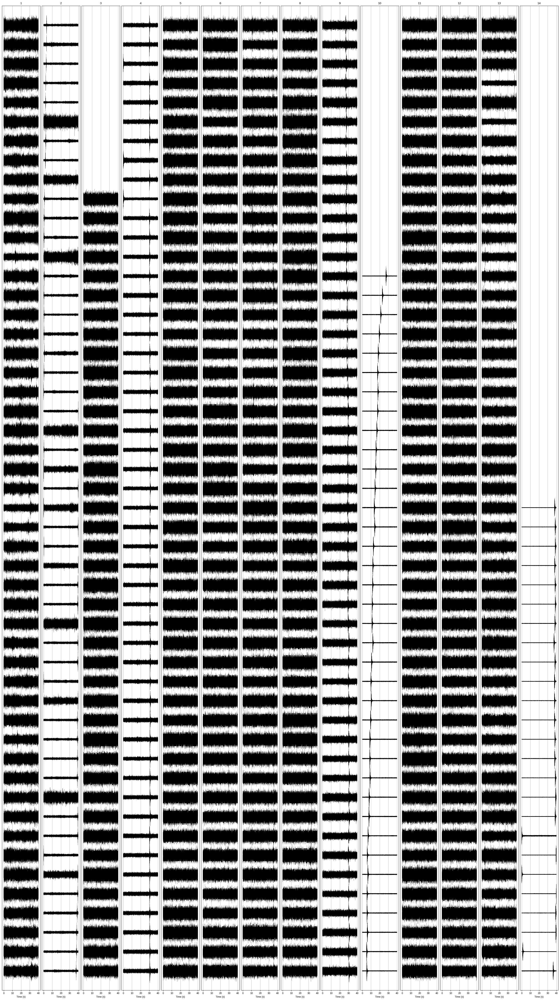

In [26]:
# Create a subplot per cluster
n_waveforms = 50
n_clusters = len(np.unique(predictions))
figWF, axes = plt.subplots(1, n_clusters, figsize=(n_clusters*2, n_waveforms), sharex=True, sharey=True)

# Turn to one-hot
one_hot = pd.get_dummies(predictions)
cluster_indexes = np.arange(n_clusters)
one_hot = xr.DataArray(one_hot, dims=["time", "cluster"], coords={"time": t[outliers==1], "cluster": cluster_indexes})

# Show waveforms for each cluster
for i in range(n_clusters):
    
    # Get indexes for this cluster
    indexes = np.where(one_hot.isel(cluster=i) == 1)[0]

    # Plot waveforms
    for j, index in enumerate(indexes[:n_waveforms]):
        data = outlier_segments[index]
        data = data / np.max(data) / 2
        time = np.arange(len(data)) / sampling_rate*1000
        axes[i].plot(time, data + j, lw=0.2, c="k")
    
        # for k in range(len(mean_times_order2[0])):
        #     axes[i].plot(mean_times_order2[index][k] / sampling_rate*1000,j+0.01, "o", color="C2", markersize=2, alpha=0.5, label="Mean time order 2" if k == 0 else None)
        # for k in range(len(mean_times_order1[0])):
        #     axes[i].plot(mean_times_order1[index][k] / sampling_rate*1000,j, "o", color="C1", markersize=2.5, alpha=0.7, label="Mean time order 1" if k == 0 else None)

    # Labels
    axes[i].set_title(f"{classes[i]}")
    axes[i].grid(True)
    axes[i].set_xlabel("Time (s)")
    axes[i].set_ylim(-1, n_waveforms)
    axes[i].set_yticks([])
plt.show()

In [27]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"OUTLIERS_WF_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
figWF.savefig(save_path,bbox_inches='tight')

### Finding times of convolutions maximum within outliers windows
Only if arg_pool is True in Analysis_param

In [28]:
from multiprocessing import Pool

def transform_waveform(index):
    """Transform a waveform into scattering coefficients."""
    # Transform waveforms into scattering space
    scattering_coefficients = loader.model.transform_sample(
        loader.segments[index], reduce_type=loader.pooling, arg_pool=True
    )
    return scattering_coefficients

argmax_times = np.zeros(len(outlier_indices), dtype=object)

# Map transform_waveform to all waveforms in parallel
with Pool(4) as pool:
    argmax_times = list(
        tqdm(
            pool.imap(transform_waveform, outlier_indices),
            desc="Transforming",
            total=len(outlier_indices),
        )
    )

# # Map transform_waveform to all waveforms NOT in parallel
# for i,id in tqdm(enumerate(outlier_indices)):
#     argmax_times[i] = transform_waveform(id)

# compute mean times for each windows (at orders 1 & 2)
mean_times_order1 = []
mean_times_order2 = []

mean_times_order1 = [ar[0].tolist() for ar in argmax_times]
mean_times_order2 = [ar[1].flatten().tolist() for ar in argmax_times]

# convert time series datapoints in time
mean_times_order1 = np.array(mean_times_order1) / sampling_rate * 1000
mean_times_order2 = np.array(mean_times_order2) / sampling_rate * 1000

Transforming:   0%|          | 0/936 [00:00<?, ?it/s]


TypeError: ScatteringNetwork.transform_sample() got an unexpected keyword argument 'arg_pool'

### Plot histograms of scattering coefficients argmax with waveforms for each cluster

In [29]:
# Create a subplot per cluster
n_waveforms = 10
n_clusters = len(np.unique(predictions))
fig_arg_cluster, axes = plt.subplots(n_waveforms, n_clusters, figsize=(n_clusters*1.3, n_waveforms*1.5), sharex=True)

# Turn to one-hot
one_hot = pd.get_dummies(predictions)
cluster_indexes = np.arange(n_clusters)
one_hot = xr.DataArray(one_hot, dims=["time", "cluster"], coords={"time": t[outliers==1], "cluster": cluster_indexes})

# Show waveforms for each cluster
for i in range(n_clusters):
    
    # Get indexes for this cluster
    indexes = np.where(one_hot.isel(cluster=i) == 1)[0]

    # Plot waveforms
    for j, index in enumerate(indexes[:n_waveforms]):

        axes[n_waveforms-j-1,i].hist(mean_times_order2[index], bins=20, color="C2", alpha=0.6, label="Order 2")
        # axes[n_waveforms-j-1,i].hist(mean_times_order1[index], bins=10, color="C1", alpha=0.8, label="Order 1")
        axes[n_waveforms-j-1,i].set_yticks([])
        axes[n_waveforms-j-1,i].set_xticks([])

        data = outlier_segments[index]
        data = data / np.max(data) *axes[n_waveforms-j-1,i].get_ylim()[1] / 2
        time = np.arange(len(data)) / sampling_rate*1000
        axes[n_waveforms-j-1,i].plot(time, data, lw=0.2, c="k",zorder=0)

    axes[n_waveforms-1,i].set_xlabel("Time (ms)", fontsize=14)
    axes[n_waveforms-1,i].set_xticks([0,10,20,30,40])
    axes[0,i].set_title(f"{classes[i]}")


# place legend outside the graph
axes[0,n_clusters-1].legend(fontsize=12, loc="upper left")

fig_arg_cluster.subplots_adjust(hspace=0.1)

plt.show()

NameError: name 'mean_times_order2' is not defined

Error in callback <function flush_figures at 0x773bb3f6b920> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"OUTLIERS_WF+ARG_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig_arg_cluster.savefig(save_path,bbox_inches='tight')

100%|██████████| 10/10 [00:00<00:00, 42.07it/s]
/tmp/ipykernel_15538/2952604131.py:54: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


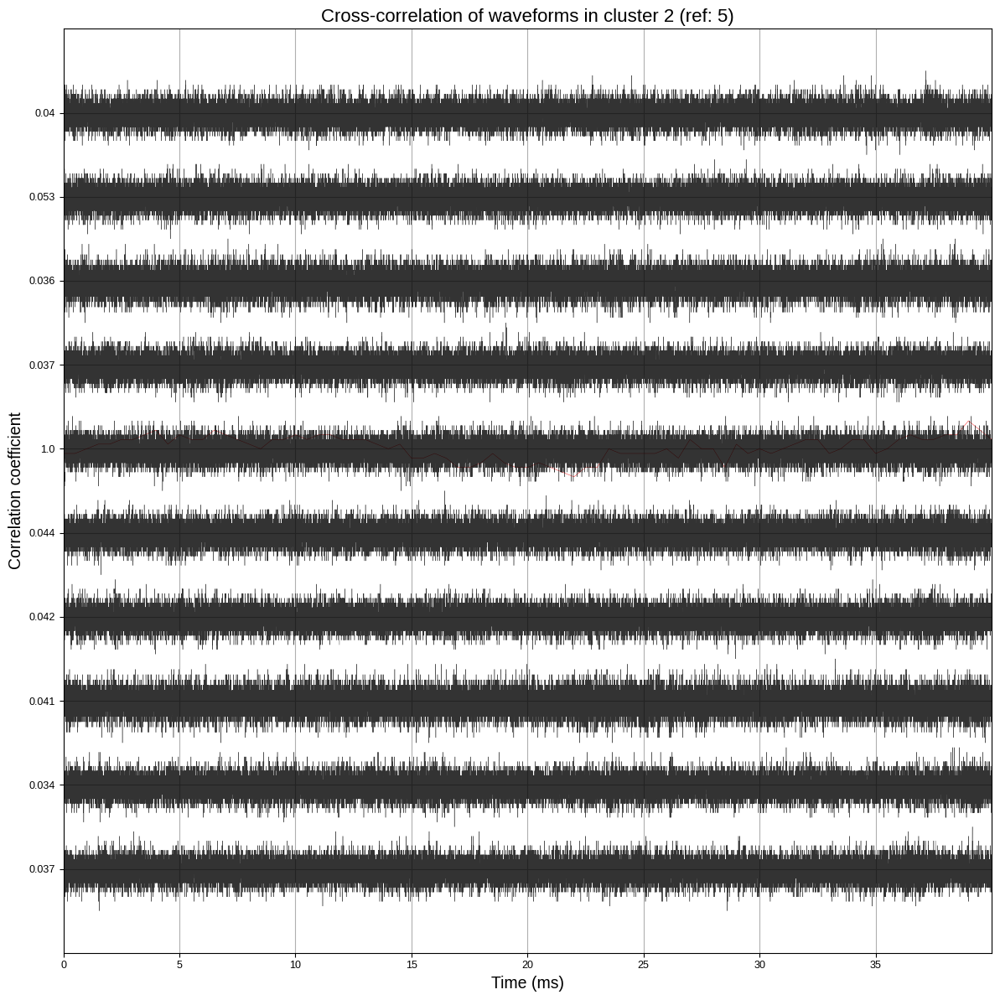

In [30]:
from scipy.signal import correlate

# Cross-correlation of waveforms in each cluster
cluster_num = 2
ref = 5

indexes = np.where(one_hot.isel(cluster=cluster_num) == 1)[0]
n_waveforms = min(10, len(indexes))

xcorr = np.zeros(n_waveforms)
delays = np.zeros(n_waveforms)

figWF_CC, ax = plt.subplots(figsize=(12, 12))

# Prepare and plot Reference signal
ref_signal = outlier_segments[indexes[ref]]
ref_signal = ref_signal / np.max(np.abs(ref_signal)) / 2
plt.plot(time*1e3, ref_signal+ref, lw=0.3, c="r", rasterized=True)

data_ = np.zeros((n_waveforms, len(ref_signal)))

# Cross-correlation
for i in tqdm(range(n_waveforms)):

    # Normalize windows
    data_signal = outlier_segments[indexes[i]]
    data_signal = data_signal / np.max(np.abs(data_signal)) / 2

    data_[i] = data_signal

    # Get delay from cross-correlation
    correlation = correlate(ref_signal, data_signal, mode="full")
    delay = np.argmax(np.abs(correlation))
    delays[i] = delay

    # Shift waveform to align with reference
    data_signal = np.roll(data_signal, len(correlation) // 2 + delay + 2)
    time = np.arange(len(data_signal)) / sampling_rate

    xcorr[i] = np.corrcoef(ref_signal, data_signal)[0, 1]

    # Plot
    plt.plot(time*1e3, data_signal + i, lw=0.3, alpha=0.8, c="k", rasterized=True)


plt.yticks(range(n_waveforms), np.round(abs(xcorr), 3))

plt.xlim(0, time.max()*1e3)
plt.ylim(-1, n_waveforms)
plt.xlabel("Time (ms)", fontsize=14)
plt.ylabel("Correlation coefficient", fontsize=14)
plt.title(f"Cross-correlation of waveforms in cluster {cluster_num} (ref: {ref})", fontsize=16)
plt.grid()  
plt.tight_layout()
plt.show()
    # correlation = np.correlate(loader.segments[indexes[ref]], loader.segments[indexes[i]], mode="full")
    # delay = np.argmanp.abs(correlation))
    # print(delay)

In [20]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"CC_WF_cl"+str(cluster_num)+"_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
figWF_CC.savefig(save_path,bbox_inches='tight')

100%|██████████| 50/50 [00:00<00:00, 60.34it/s]
/tmp/ipykernel_15538/2364062946.py:42: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


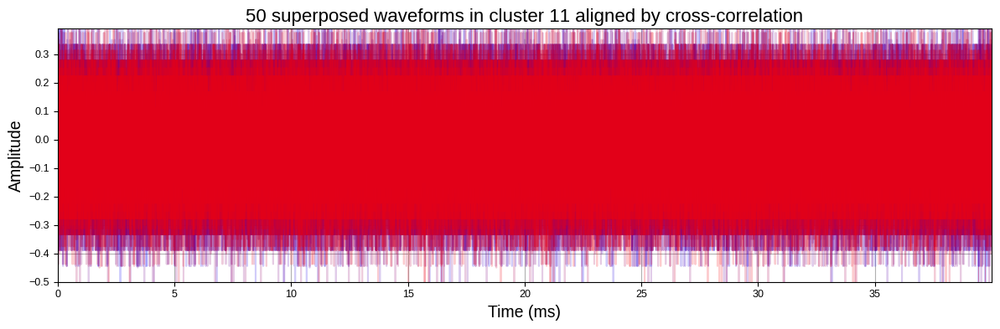

In [31]:
from scipy.signal import correlate

# Cross-correlation of waveforms in each cluster
cluster_num = 11
ref = 0

indexes = np.where(one_hot.isel(cluster=cluster_num) == 1)[0]
n_waveforms = min(50, len(indexes))

figWF_superposed, ax = plt.subplots(figsize=(12, 4))

# Prepare and plot Reference signal
ref_signal = outlier_segments[indexes[ref]]
ref_signal = ref_signal / np.max(np.abs(ref_signal)) / 2
plt.plot(time*1e3, ref_signal, lw=0.3, alpha=0.5, c="r", rasterized=True)

# Cross-correlation
for i in tqdm(range(n_waveforms)):

    # Normalize windows
    data_signal = outlier_segments[indexes[i]]
    data_signal = data_signal / np.max(np.abs(data_signal)) / 2

    # Get delay from cross-correlation
    correlation = correlate(ref_signal, data_signal, mode="full")
    # print(np.max(correlation))
    delay = np.argmax(np.abs(correlation))

    # Shift waveform to align with reference
    data_signal = np.roll(data_signal, len(correlation) // 2 + delay + 2)
    time = np.arange(len(data_signal)) / sampling_rate

    # Plot
    plt.plot(time*1e3, data_signal, alpha=0.2, c=[i/n_waveforms, 0, 1-i/n_waveforms], rasterized=True)

plt.xlim(0, time.max()*1e3)
plt.ylim([data_signal.min(), data_signal.max()])
plt.xlabel("Time (ms)", fontsize=14)
plt.ylabel("Amplitude", fontsize=14)
plt.title(f"{n_waveforms} superposed waveforms in cluster {cluster_num} aligned by cross-correlation", fontsize=16)
plt.grid()  
plt.tight_layout()
plt.show()
    # correlation = np.correlate(loader.segments[indexes[ref]], loader.segments[indexes[i]], mode="full")
    # delay = np.argmanp.abs(correlation))
    # print(delay)

In [38]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"Superposed_WF_cl"+str(cluster_num)+"_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+"_zoom1.pdf"
figWF_superposed.savefig(save_path,bbox_inches='tight')

### Plot a waveform

Cluster number: 9
Waveform index: 505


(0.0, 40.0)

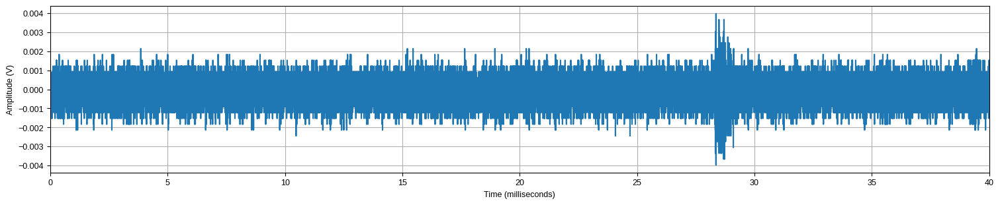

In [33]:
# plot a random waveform of a specific cluster
cluster_number = 9
cluster_waveforms = np.where(predictions == cluster_number)[0]
index = np.random.choice(cluster_waveforms)
waveform = loader.segments[outlier_indices[index]]
t_waveform = np.arange(len(waveform)) / sampling_rate
# print cluster number
print(f"Cluster number: {cluster_number}")
print(f"Waveform index: {index}")
# Plot
figWF_cl, ax = plt.subplots(figsize=(15, 3))
ax.plot(t_waveform*1000, waveform)
ax.set_xlabel("Time (milliseconds)")
ax.set_ylabel("Amplitude (V)")
ax.grid()

# axis tight
ax.set_xlim(0, 40)

In [48]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"OUTLIERS_WF-cl"+str(cluster_number)+"_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
figWF_cl.savefig(save_path,bbox_inches='tight')

### Scattering spectrograms of clusters

IndexError: index 14 is out of bounds for axis 1 with size 14

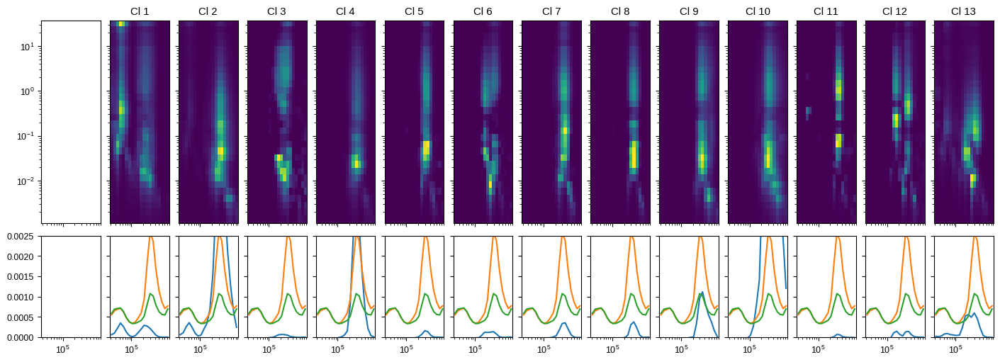

In [35]:
# Extract matrix
n = scattering_coefficients.time.shape[0]
x1 = scattering_coefficients.order_1.data.reshape(n, -1)
x2 = scattering_coefficients.order_2.data.reshape(n, -1)
vmin, vmax = x2.min(), x2.max()


acoustic_background_order_2_mean = x2[outlier_detections==0].mean(axis=0)
acoustic_background_order_1_mean = x1[outlier_detections==0].mean(axis=0)

# Plot
n_clusters = len(classes)
fig, ax = plt.subplots(nrows=2, ncols=n_clusters, figsize=(len(classes), 5), sharex=True, sharey="row", gridspec_kw={"height_ratios": [2, 1]}, constrained_layout=True)
for category in classes:
    # print(category)
    # print(x2[outlier_detections == 1][predictions == category].shape)
    order_2 = x2[outlier_detections == 1][predictions == category].mean(axis=0) 
    order_2 -= acoustic_background_order_2_mean
    order_2 = order_2.reshape(*scattering_coefficients.order_2.shape[2:])
    img = ax[0, category].pcolormesh(scattering_coefficients.f1, 1/scattering_coefficients.f2*1000, order_2.T, shading="auto", rasterized=True,vmin=vmin) # add vmin=vmin, vmax=vmax for real contrast
    ax[0, category].set_xscale("log")
    ax[0, category].set_yscale("log")
    ax[0, category].set_title(f"Cl {category}")

    order_1 = x1[outlier_detections == 1][predictions == category].mean(axis=0)
    order_1 -= acoustic_background_order_1_mean
    # ax[1, category].set_yscale("log")
    ax[1, category].set_ylim([0,0.0025])
    ax[1, category].plot(scattering_coefficients.f1, order_1)
    ax[1, category].plot(scatterings_normalized.f1, x1[outlier_detections == 1].mean(axis=0))
    ax[1, category].plot(scatterings_normalized.f1, x1.mean(axis=0))

# add a legend
ax[1, int(np.fix((len(classes)-1)/2))].set_xlabel("Frequency (Hz)")
ax[0, 0].set_ylabel("Time (ms)")
ax[1, int(np.fix((len(classes)-1)/2))].legend(["Cluster","Outliers","Overall"], loc="upper right") 
# cbar = plt.colorbar(img, ax=ax[0, :])


In [261]:
# save the figure in pdf format including the name the umap parameters, the channel and the pooling. The file will be saved in the directory precised in the loader.py file
save_path = loader.fig_path+"OUTLIERS_diff-scat-coeff_umap"+str(umap_model.n_neighbors)+"-"+str(umap_model.min_dist)+"_"+loader.data_file[7:-4]+"_"+loader.pooling+".pdf"
fig.savefig(save_path,bbox_inches='tight')